In [70]:
import os, glob, csv

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from scipy.stats import gamma, multivariate_normal
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics.pairwise import linear_kernel, cosine_similarity
from sklearn.metrics.pairwise import sigmoid_kernel, rbf_kernel, laplacian_kernel
from sklearn.metrics.pairwise import chi2_kernel, polynomial_kernel
from sklearn.decomposition import PCA, KernelPCA
from sklearn.mixture import BayesianGaussianMixture

# Load all datasets (load, solar, wind) of a given day
def _load_all_datasets(path_to_data):
    # Load csv avoiding errors in the headers
    def __read_csv_file(file_name):
        with open(file_name) as _file:
            rows_ = []
            for row in csv.reader(_file, delimiter = ','):
                row = np.asarray(row[2:])[:, np.newaxis]
                rows_.append(row)
        rows_.pop(0)
        return np.concatenate(rows_, axis = 1).T
    # Load a load, solar or wind file
    def __load_dataset(path_to_data, source):
        y_ac_all_ = []
        y_fc_all_ = []
        Y_sc_all_ = []
        # Loop over found files in the directory
        for file in os.listdir(path_to_data + source):
            # Read .csv file using pandas
            Y_    = pd.read_csv(path_to_data + source + file)
            # Remove headers and row names and get time series
            y_ac_ = Y_.to_numpy()[0, 2:]
            y_fc_ = Y_.to_numpy()[1, 2:]
            Y_sc_ = Y_.to_numpy()[2:, 2:].T

            # Read .csv file using csv
            Y_    = __read_csv_file(path_to_data + source + file)
            y_ac_ = Y_[0, :].astype(np.float)
            y_fc_ = Y_[1, :].astype(np.float)
            Y_sc_ = Y_[2:, :].astype(np.float).T

            y_ac_all_.append(y_ac_[:, np.newaxis])
            y_fc_all_.append(y_fc_[:, np.newaxis])
            Y_sc_all_.append(Y_sc_[..., np.newaxis])

        return np.concatenate(y_ac_all_, axis = 1), np.concatenate(y_fc_all_, axis = 1), np.concatenate(Y_sc_all_, axis = 2)
    
    L_ac_, L_fc_, L_sc_ = __load_dataset(path_to_data, source = r'/load/')
    S_ac_, S_fc_, S_sc_ = __load_dataset(path_to_data, source = r'/solar/')
    W_ac_, W_fc_, W_sc_ = __load_dataset(path_to_data, source = r'/wind/')
    return [L_ac_, L_fc_, L_sc_], [S_ac_, S_fc_, S_sc_], [W_ac_, W_fc_, W_sc_]

# Compute sample probability assiming joint gamma distribution
def _joint_gamma_dist(Y_sc_):
    g_sc_ = np.ones(Y_sc_.shape[1])  
    for i in range(Y_sc_.shape[0]):
        y_sc_  = np.array(Y_sc_[i, :].T, dtype = float)
        theta_ = gamma.fit(y_sc_)
        _G     = gamma(a     = theta_[0], 
                       loc   = theta_[1], 
                       scale = theta_[2])

        g_sc_ *= _G.pdf(y_sc_)
    return g_sc_

# Compute sample probability assiming multivariate normal distribution
def _multivariate_norma_dist(Y_sc_):
    y_sc_  = np.array(Y_sc_.T, dtype = float)
    mu_    = np.mean(y_sc_, axis = 0)
    Sigma_ = np.cov(y_sc_.T)
    return multivariate_normal(mu_, Sigma_).pdf(y_sc_)

def _plot(Y_sc_, y_ac_, y_fc_, g_sc_):

    x_24_ = np.arange(0, y_fc_.shape[0], 1)
    
    plt.figure(figsize = (20, 5.5))
    plt.subplot(121)
    plt.title(r'Net Load Scenarios')
    plt.plot(x_24_, Y_sc_, color = 'gray', alpha = 0.75, linewidth = .1)
    plt.plot(x_24_, y_ac_, color = 'red', marker = '+', label = r'ac')
    plt.plot(x_24_, y_fc_, color = 'black', marker = 'o', markerfacecolor = 'None', label = r'fc')
    plt.legend()
    plt.grid()

    colors_ = plt.cm.viridis(np.linspace(0, 1., 1000))
    idx_    = np.argsort(g_sc_)
    
    plt.subplot(122)
    plt.title(r'Net Load Scenarios Density')

    for i in range(1000):    
        plt.plot(x_24_, Y_sc_[:, idx_[i]], color = colors_[i], alpha = 1., linewidth = .1)
    plt.grid()
    plt.show()

/Users/Guille/Desktop/STATS/data/SimDat_20180722


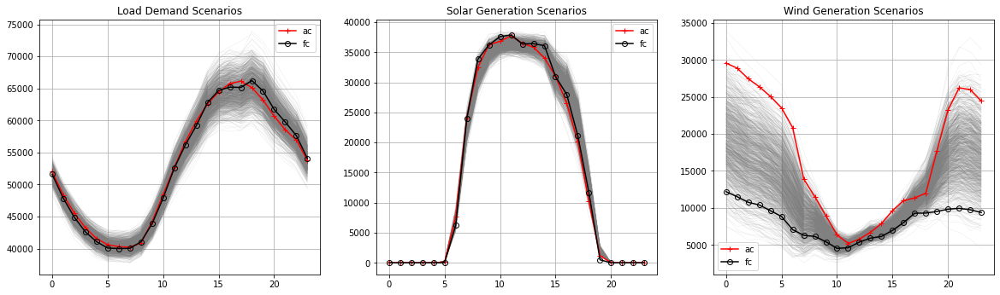

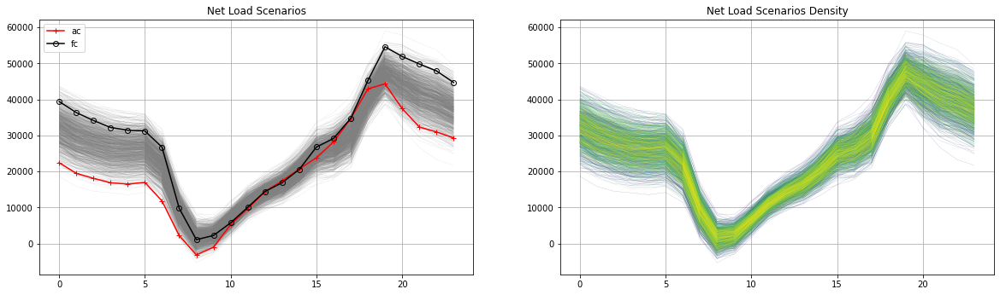

[0 1 2 3 4 5 6 7 8 9] [832   4   7  16  70   4   6  17  42   2]


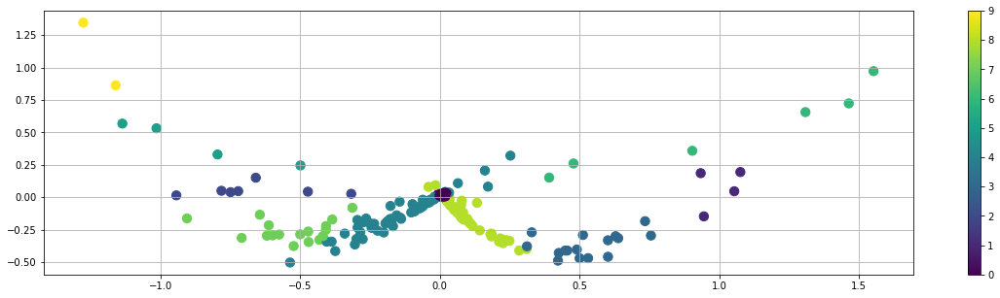

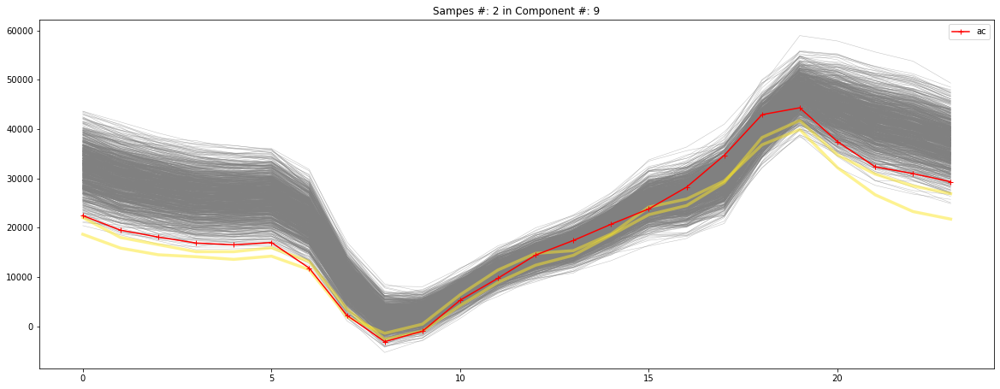

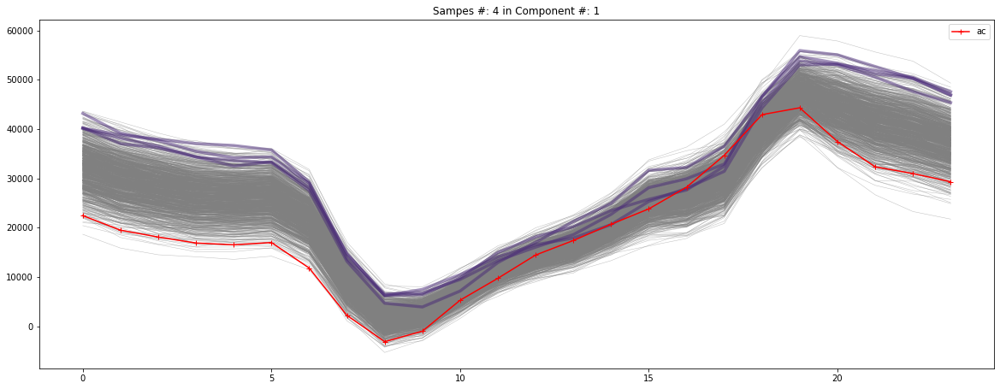

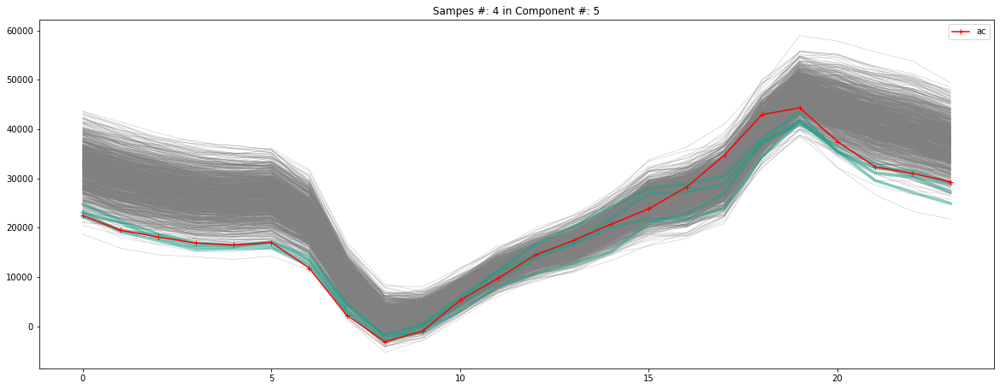

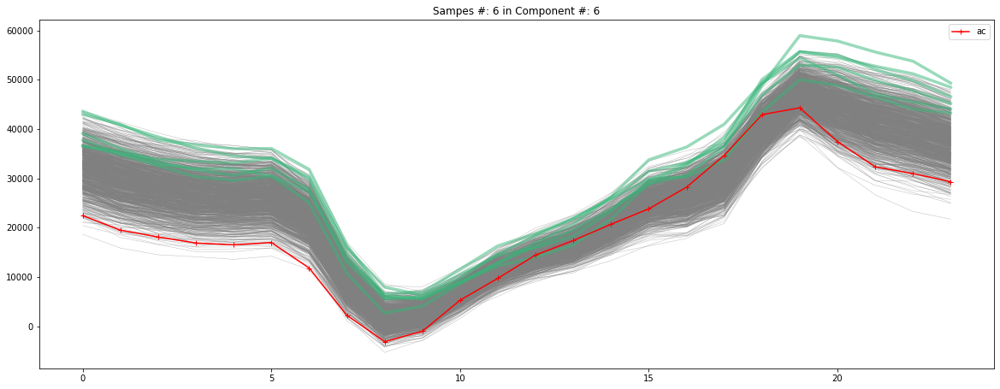

...

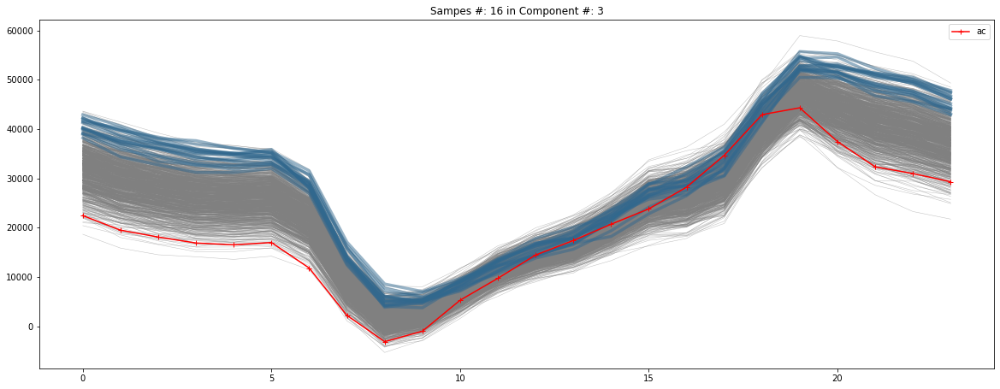

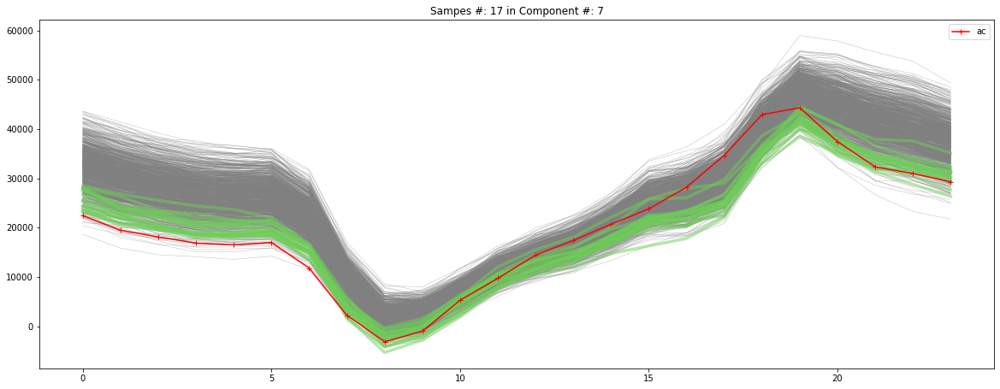

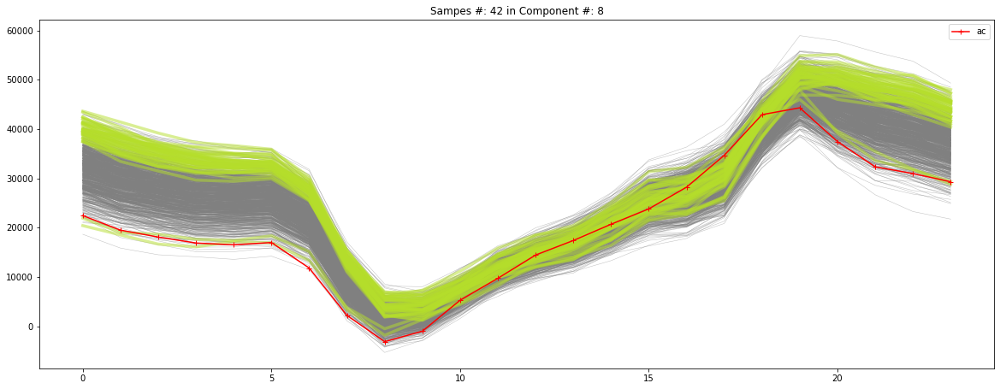

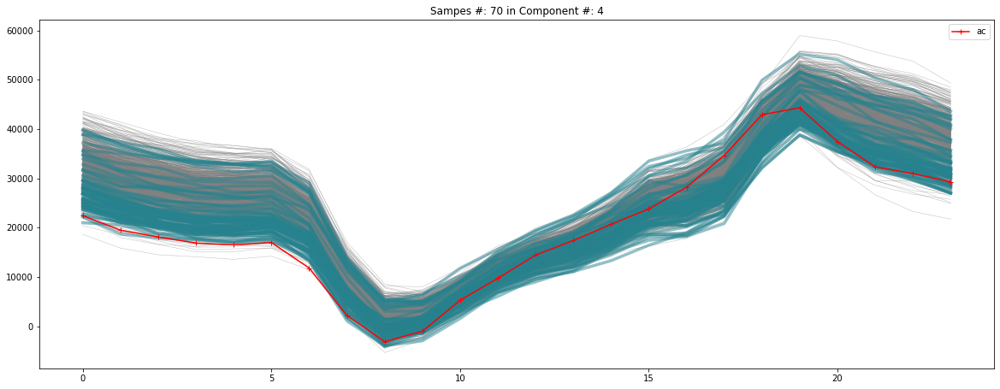

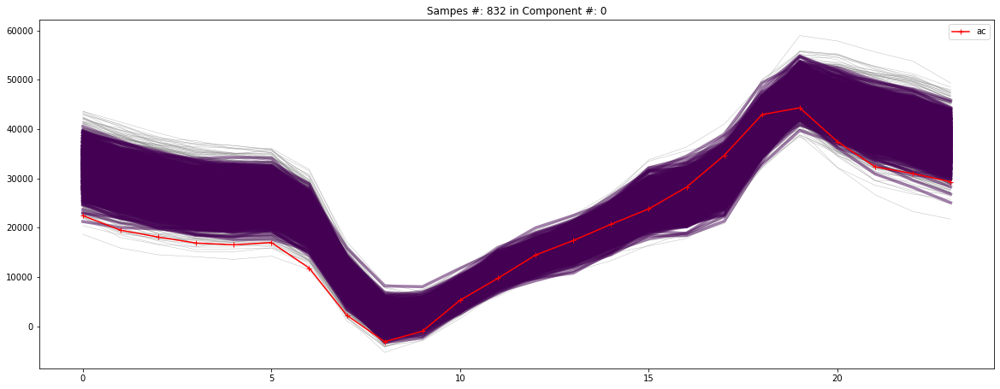

/Users/Guille/Desktop/STATS/data/SimDat_20181126


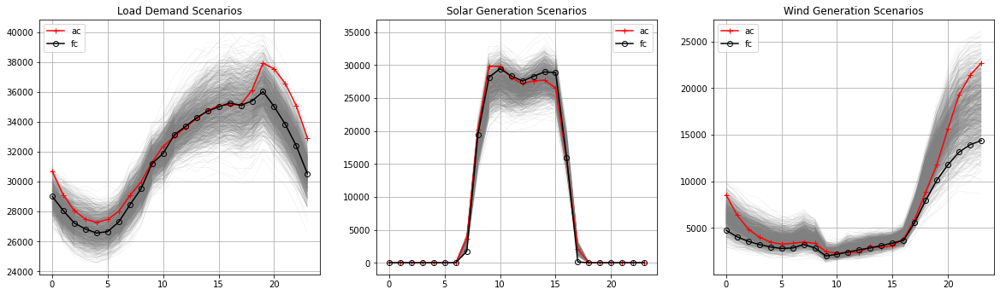

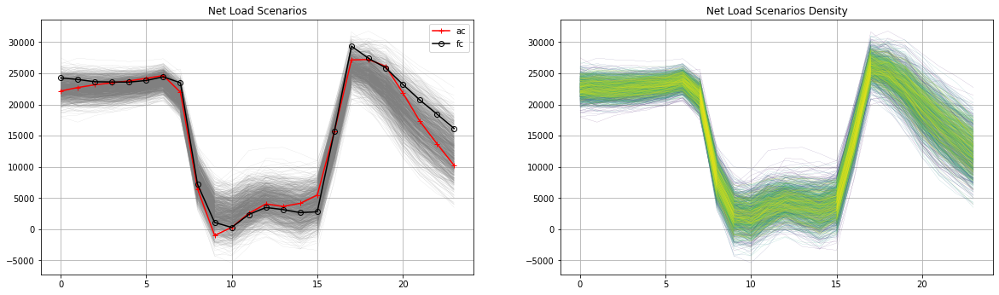

[ 0  1  3  4  5  6  7  8 10 12] [885   8   1  31   6   6   7  54   1   1]


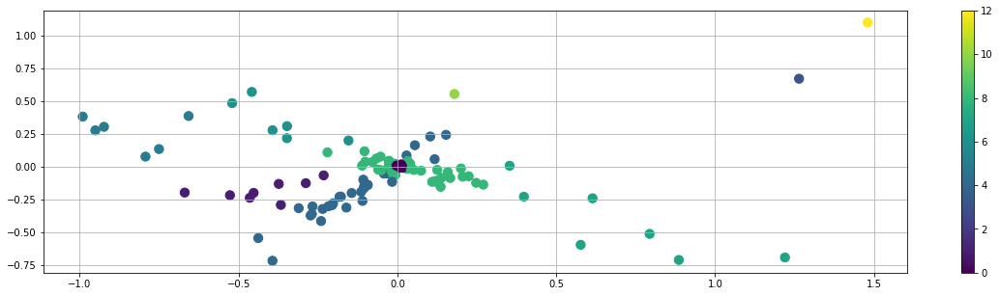

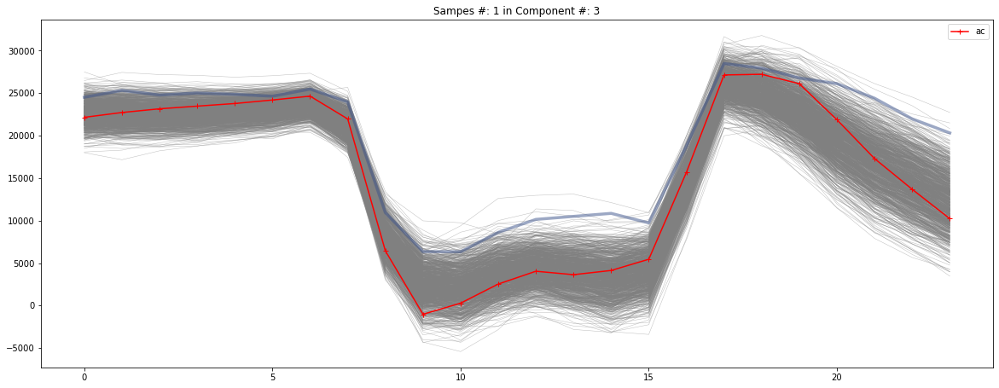

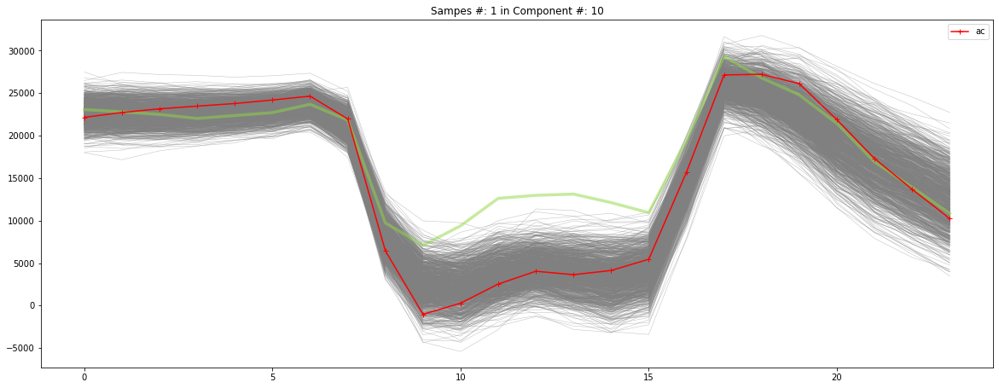

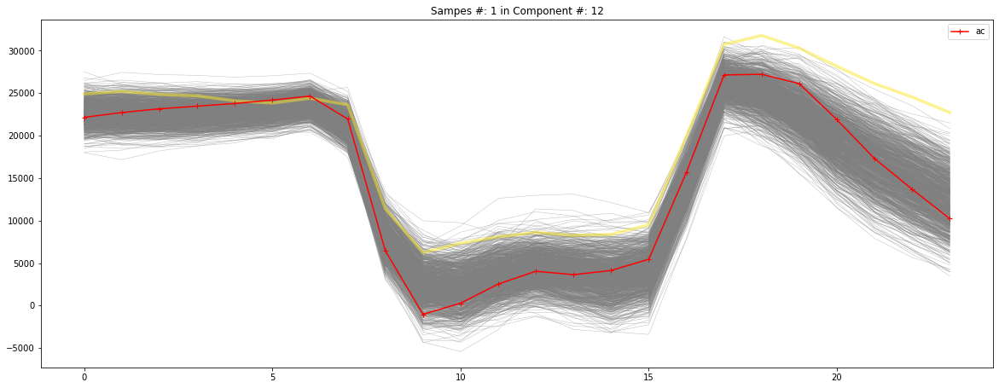

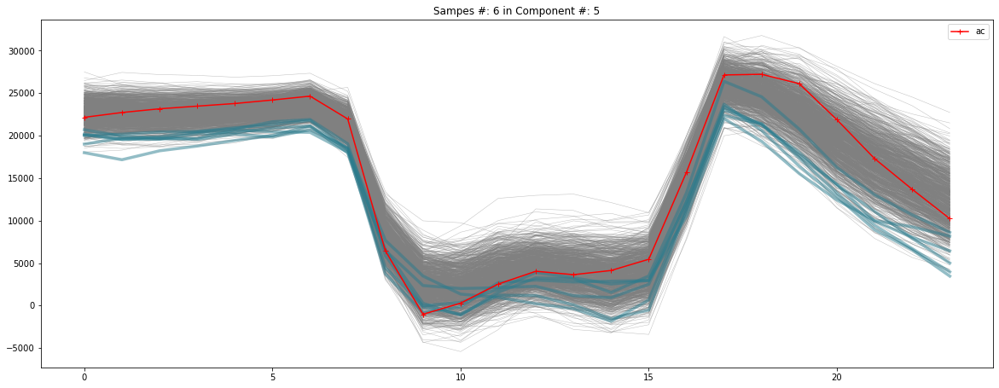

...

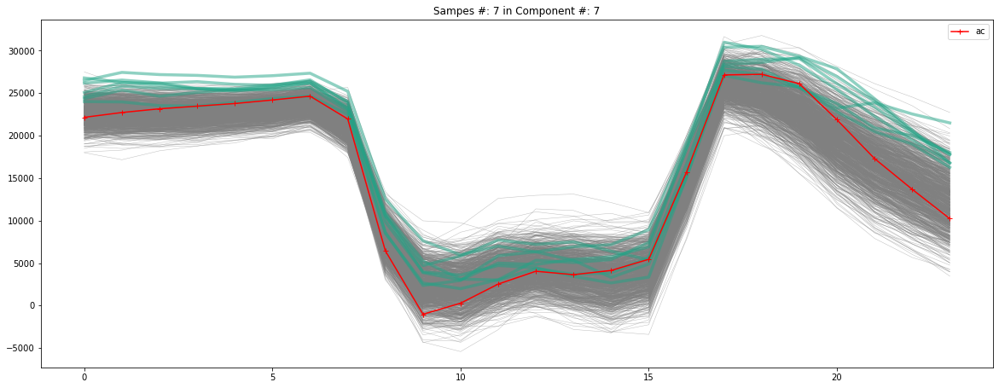

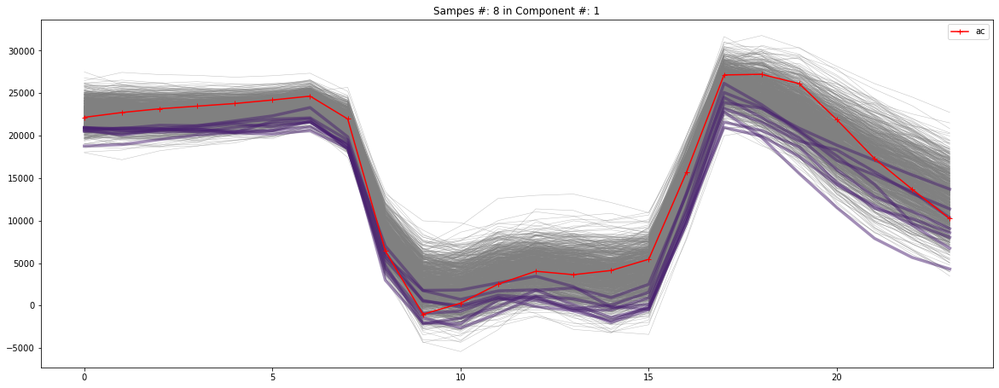

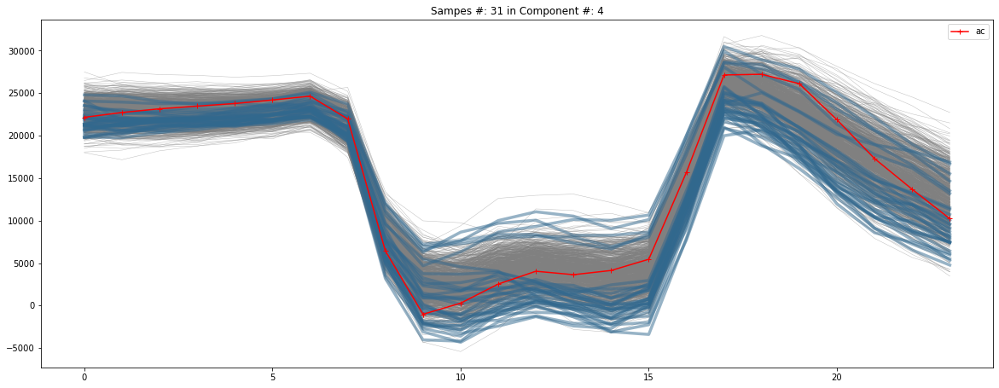

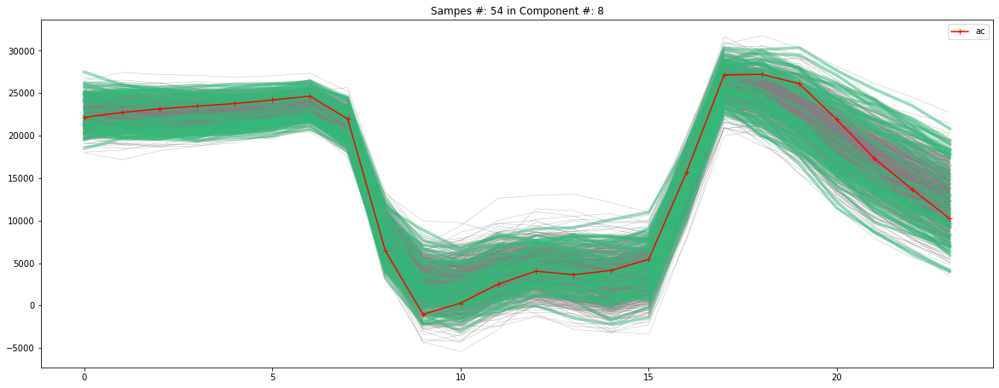

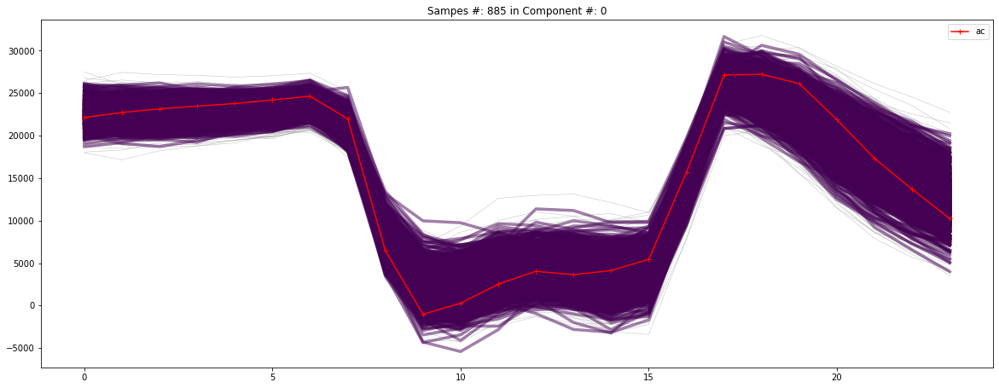

/Users/Guille/Desktop/STATS/data/SimDat_20180613


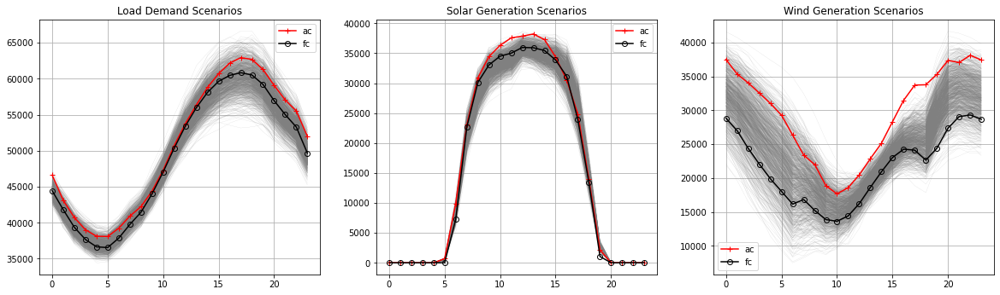

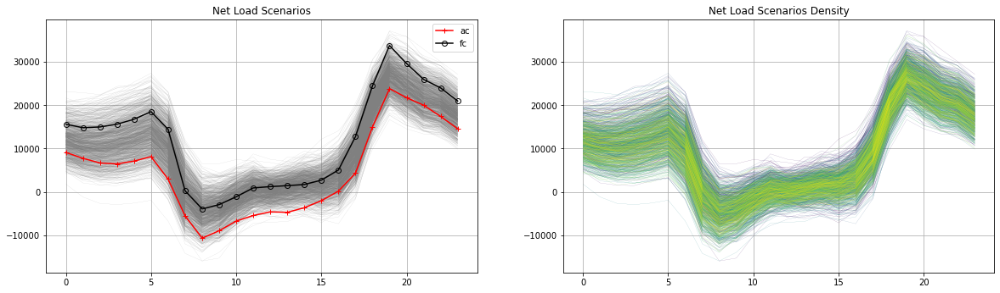

[0 1 2 3 4 5 6 8 9] [762  25  10  26   1 123   8   4  41]


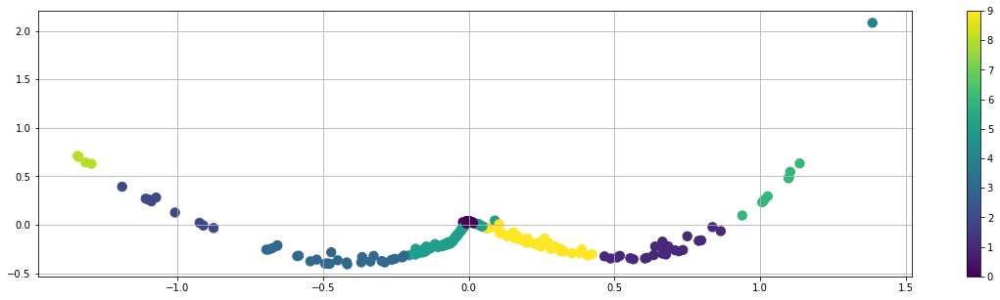

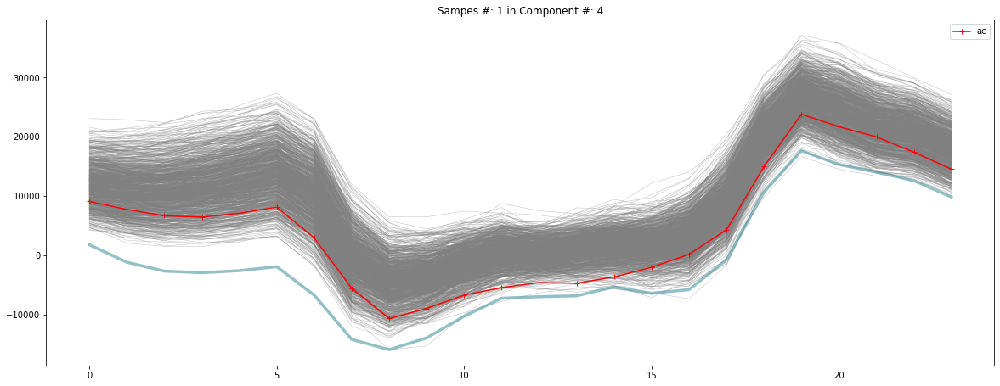

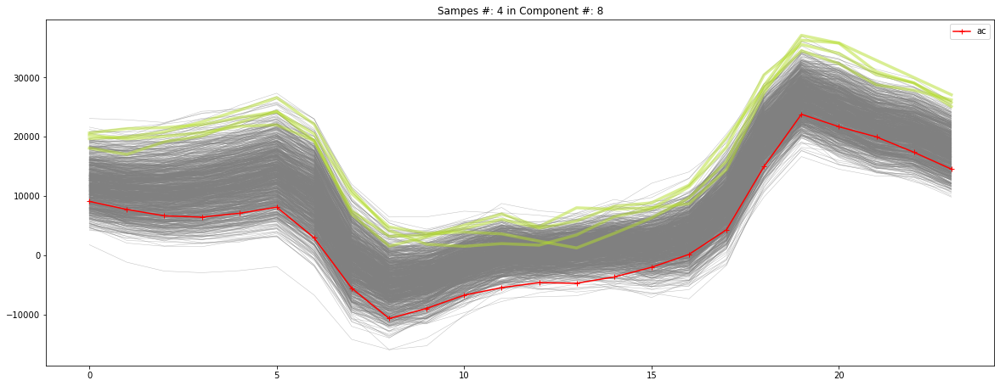

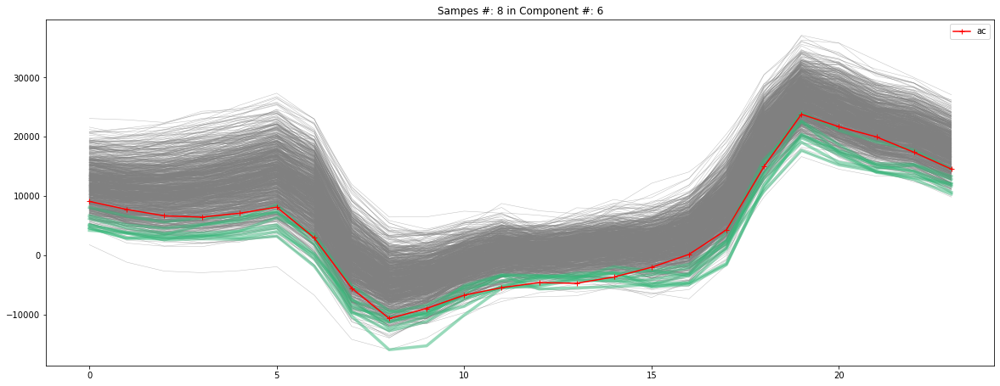

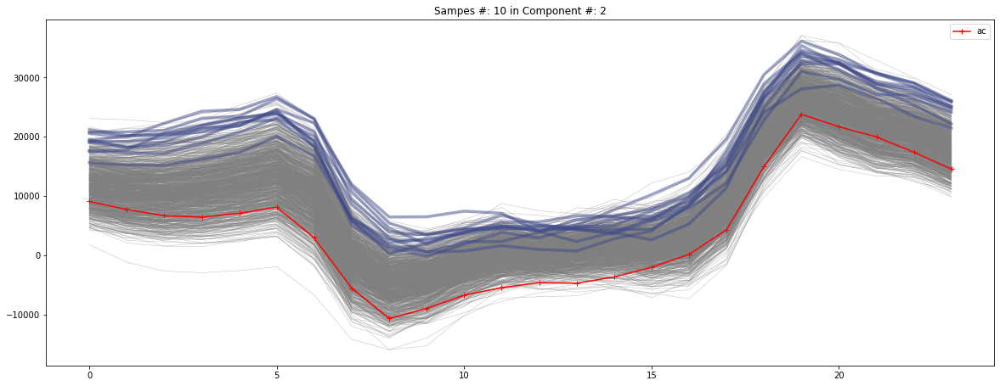

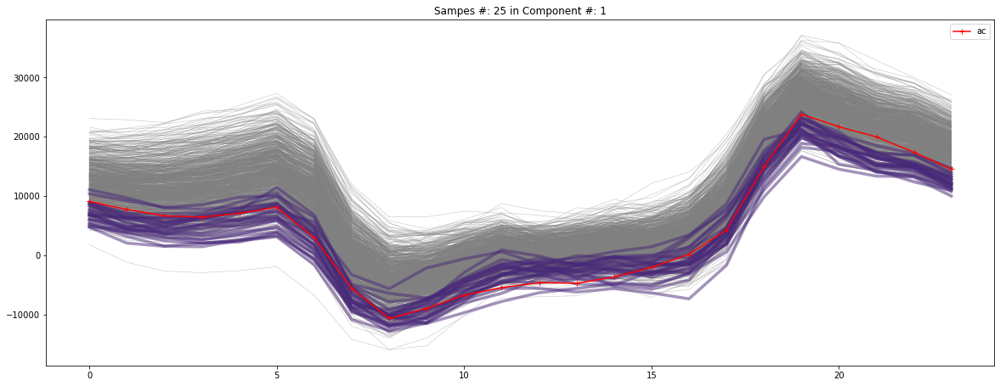

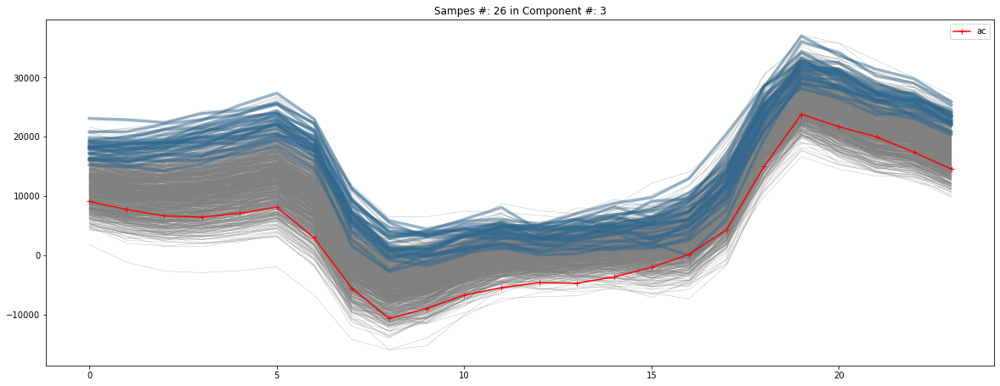

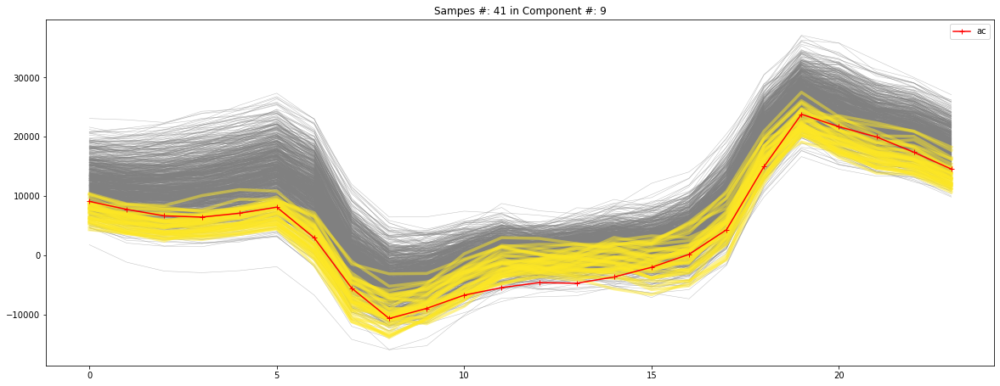

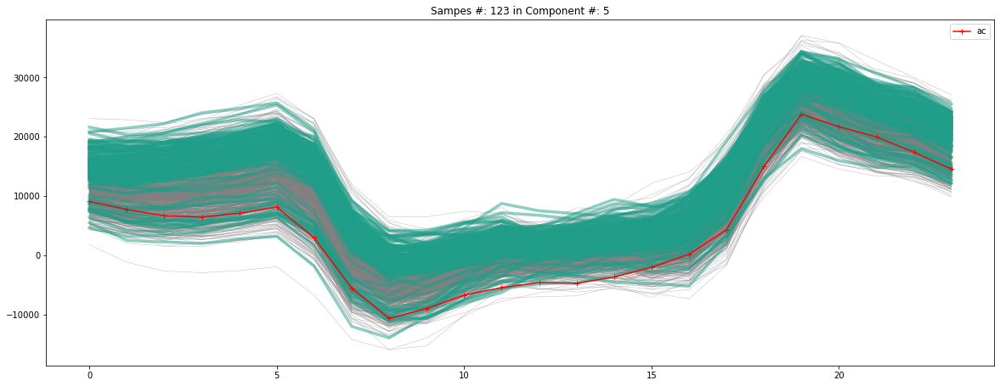

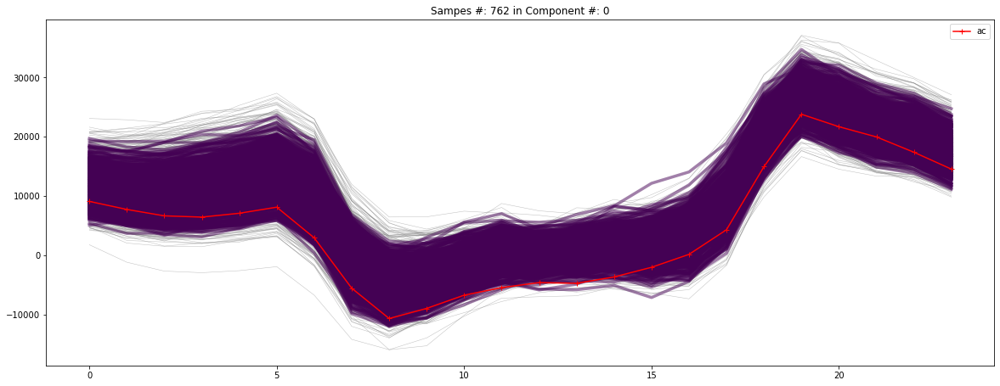

/Users/Guille/Desktop/STATS/data/SimDat_20180702


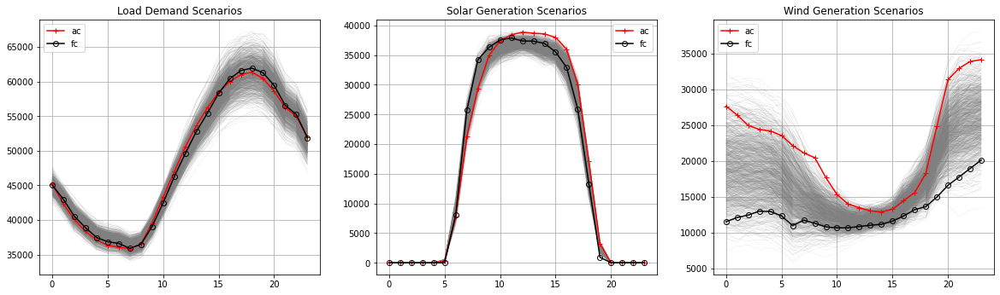

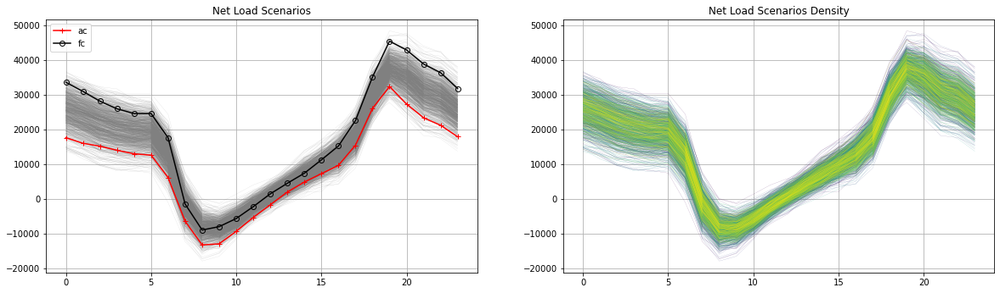

[ 0  1  3  4  6  8  9 10] [825  18  11   8  31  20  54  33]


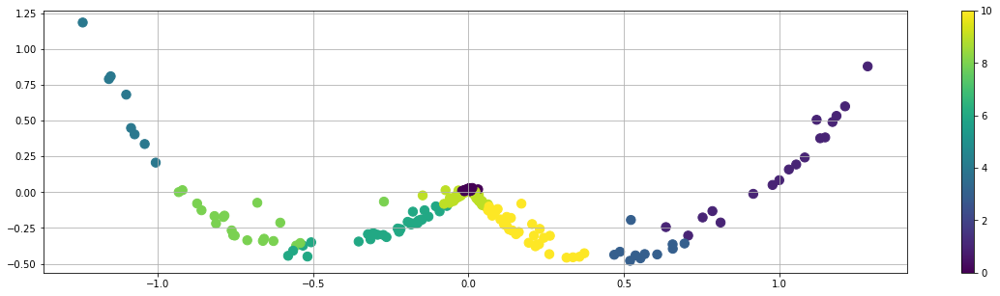

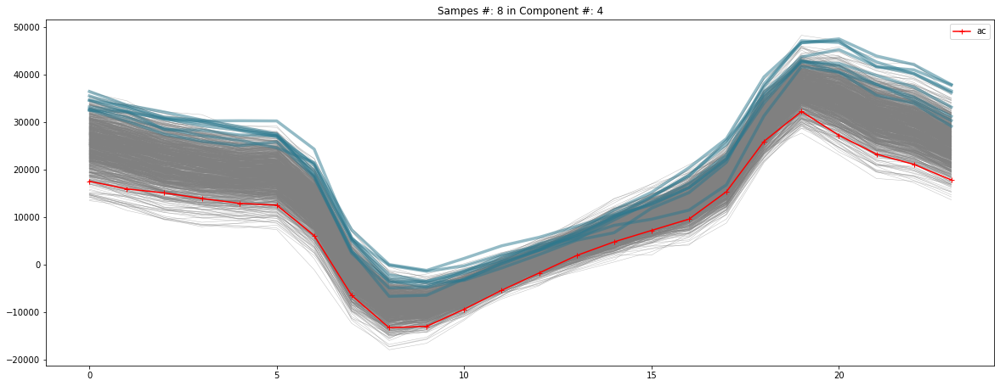

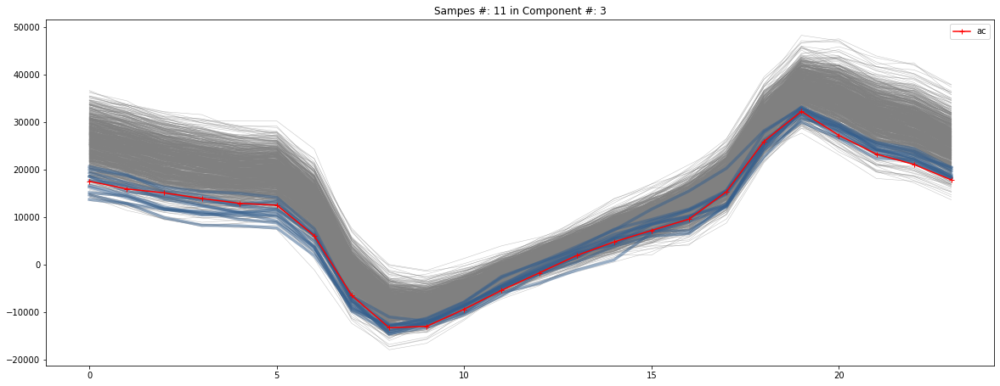

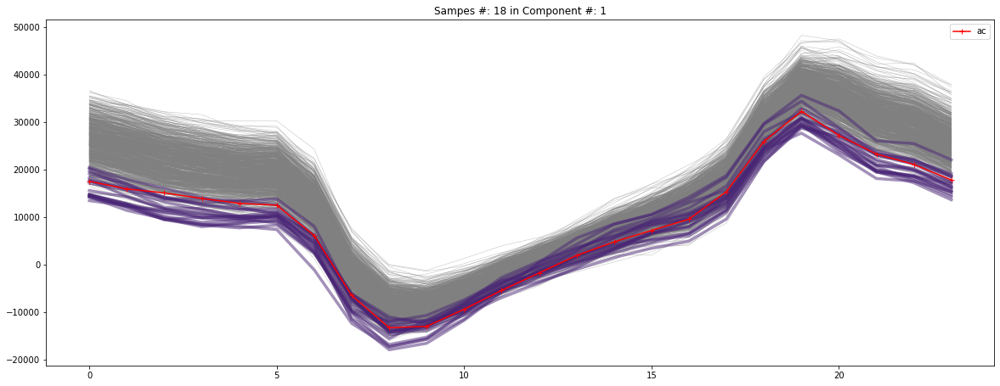

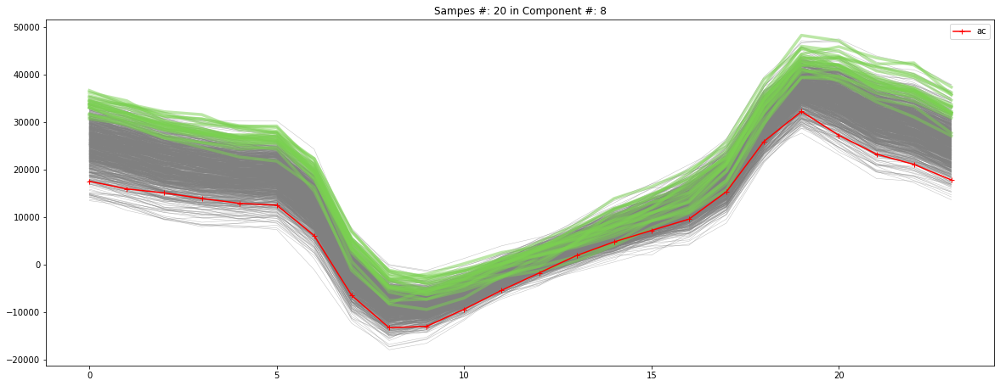

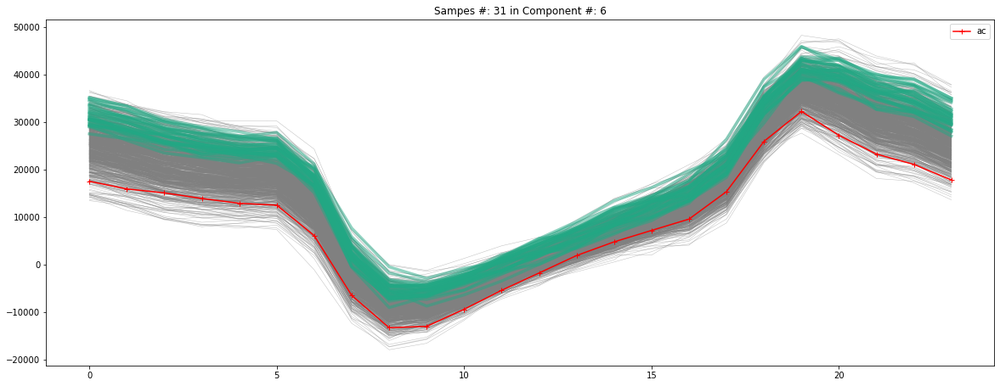

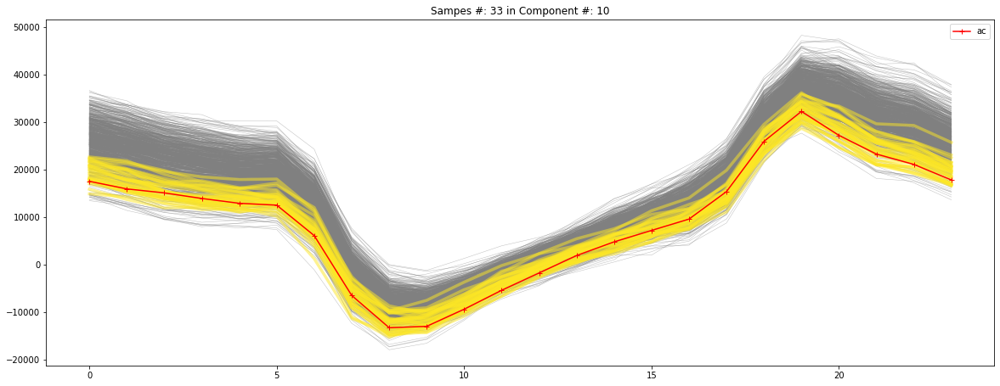

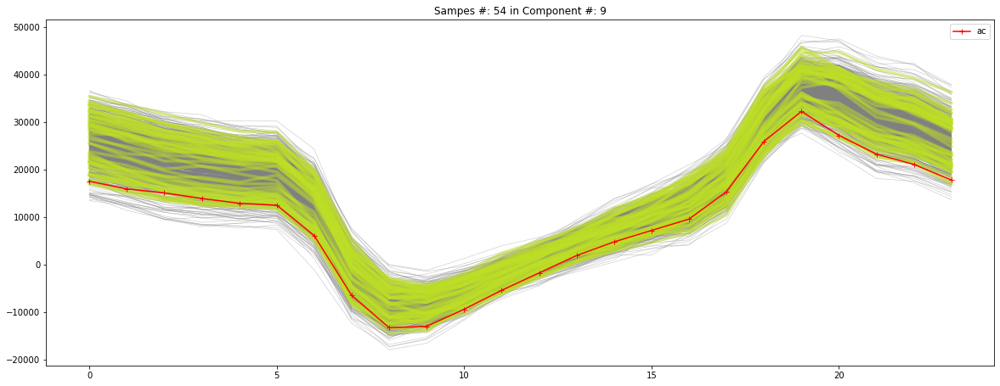

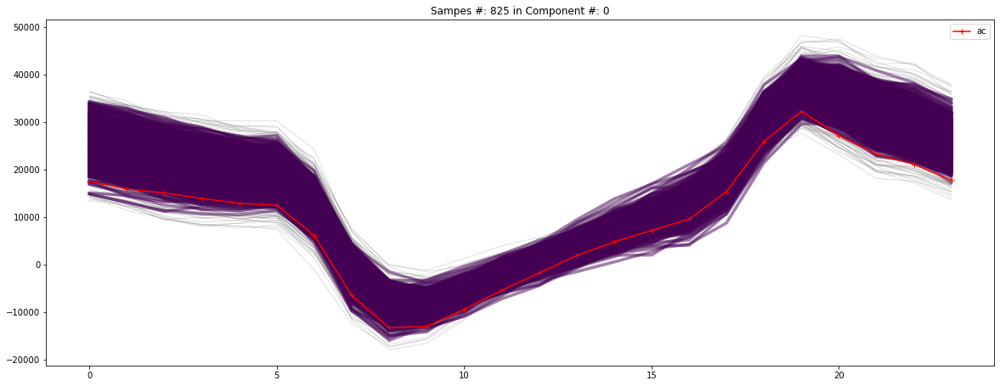

/Users/Guille/Desktop/STATS/data/SimDat_20180718


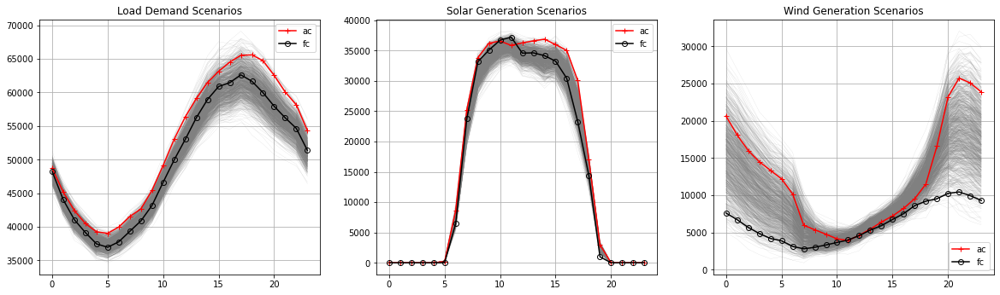

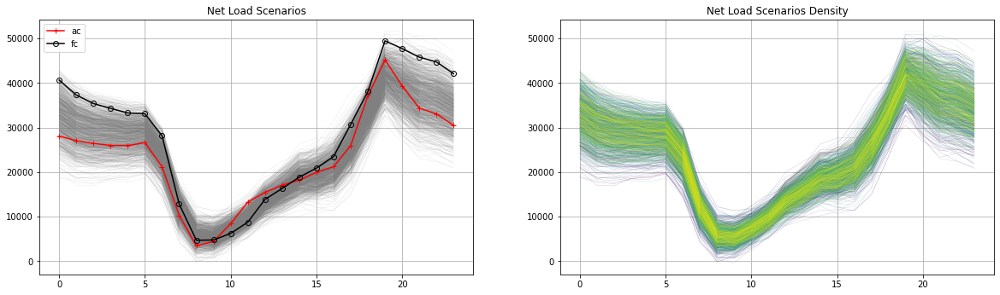

[ 0  1  2  3  5  6  7  8  9 12] [779  43   8   4 115   1  34   8   7   1]


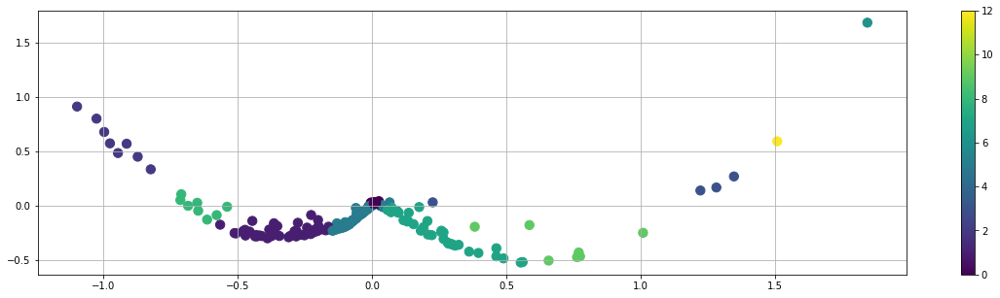

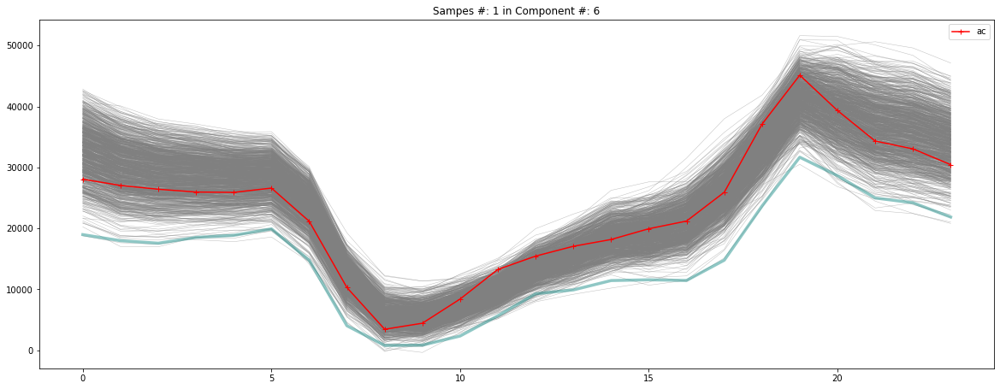

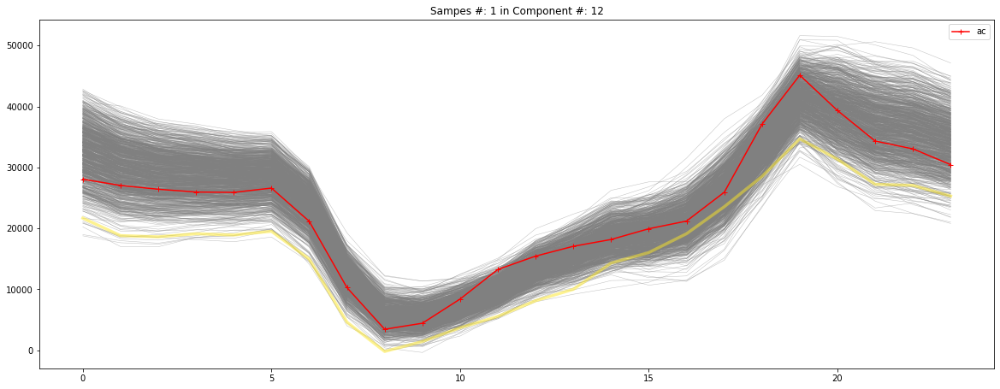

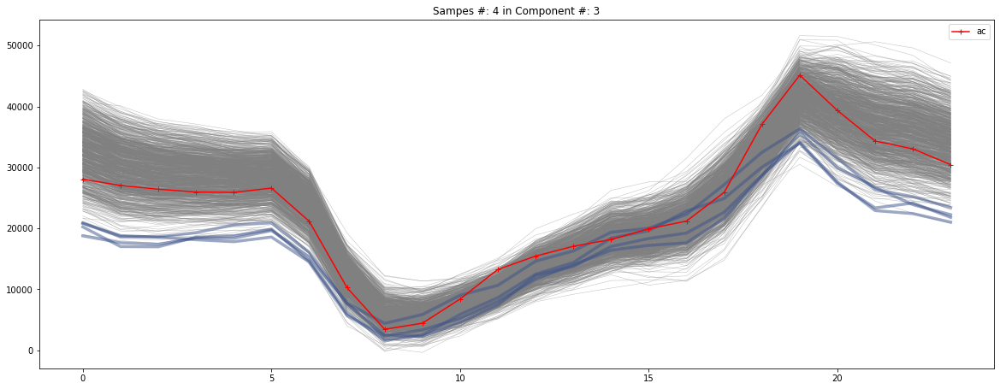

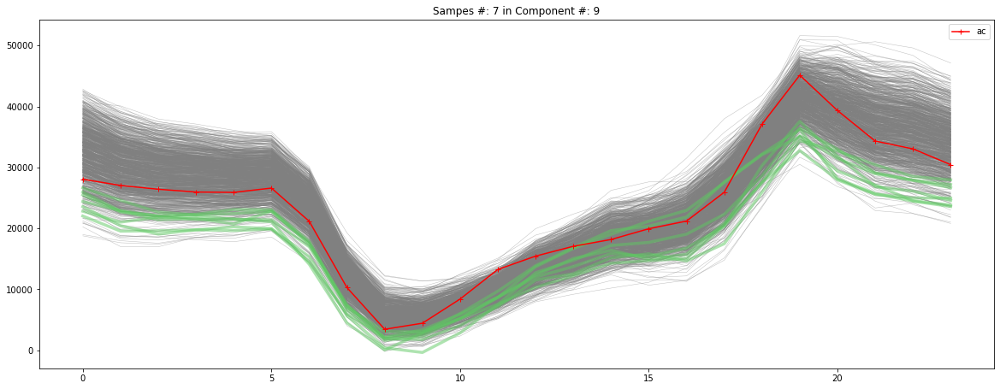

...

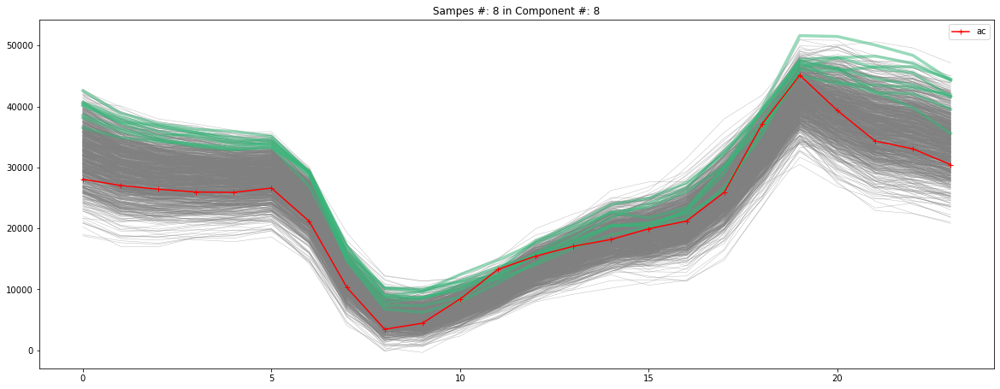

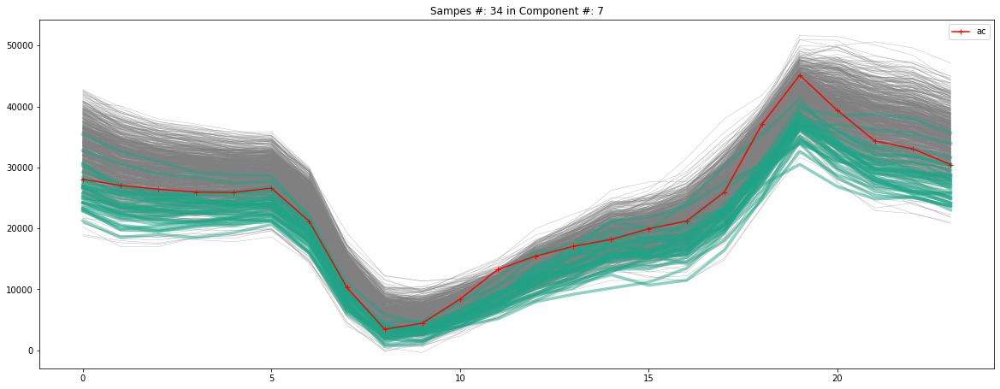

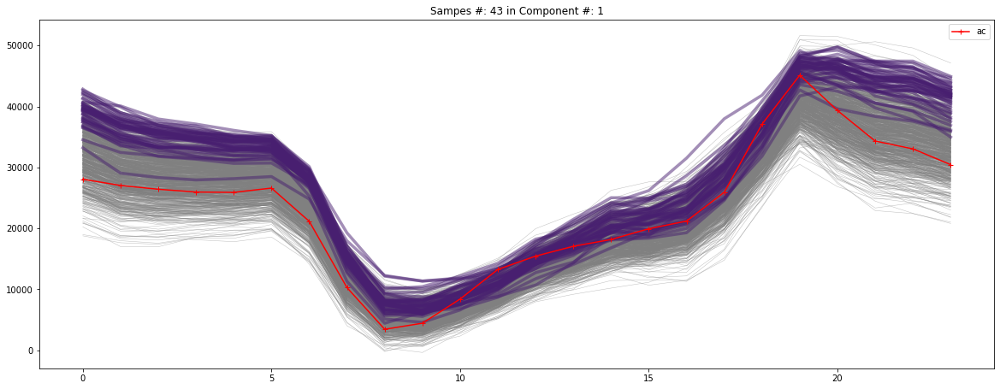

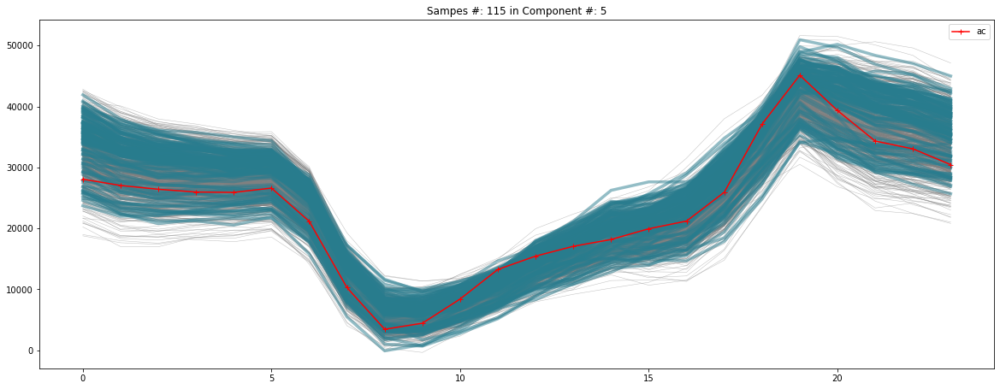

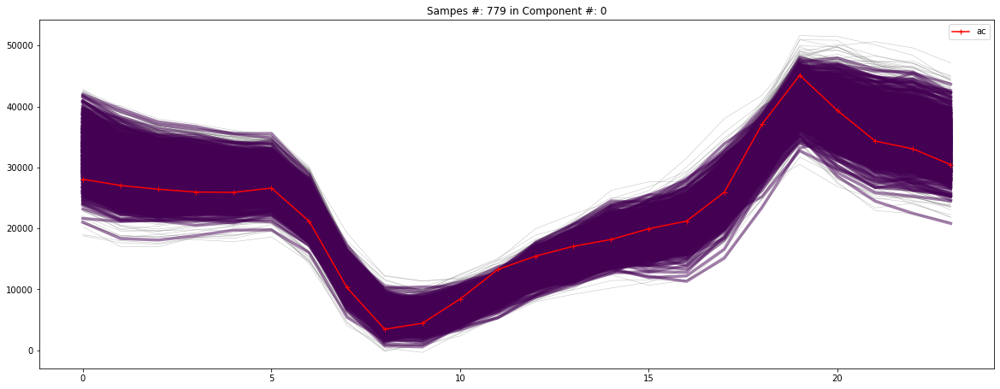

/Users/Guille/Desktop/STATS/data/SimDat_20180911


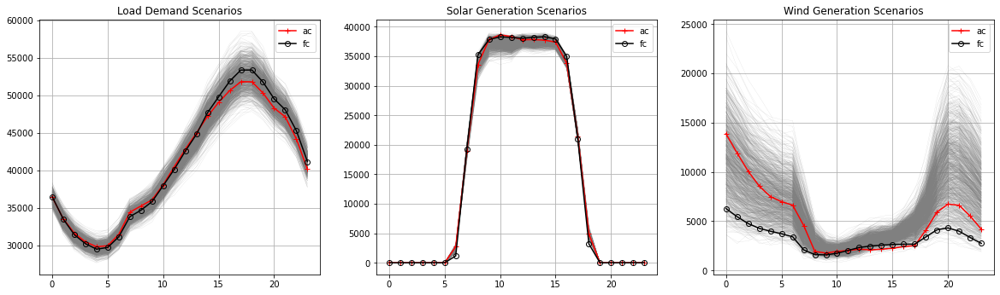

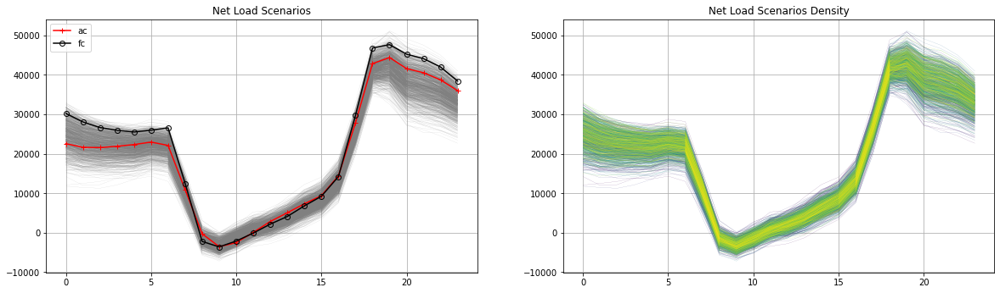

[0 1 2 3 4 5 6 7 8 9] [816  19  16  41   1  37   5   3  61   1]


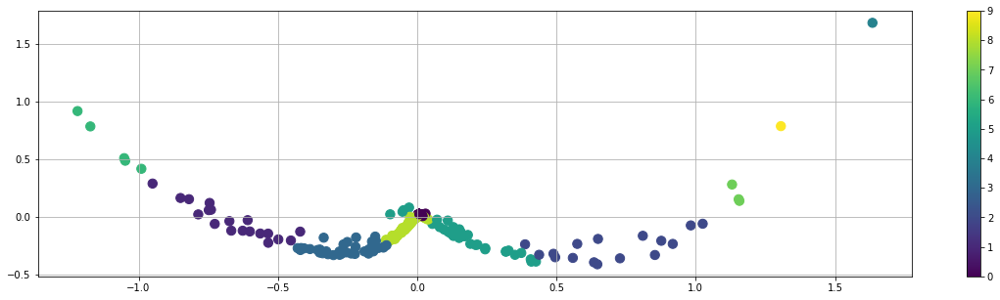

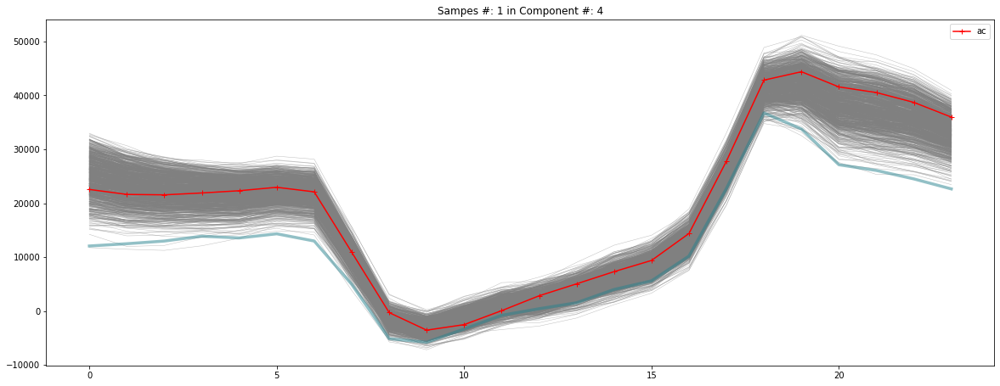

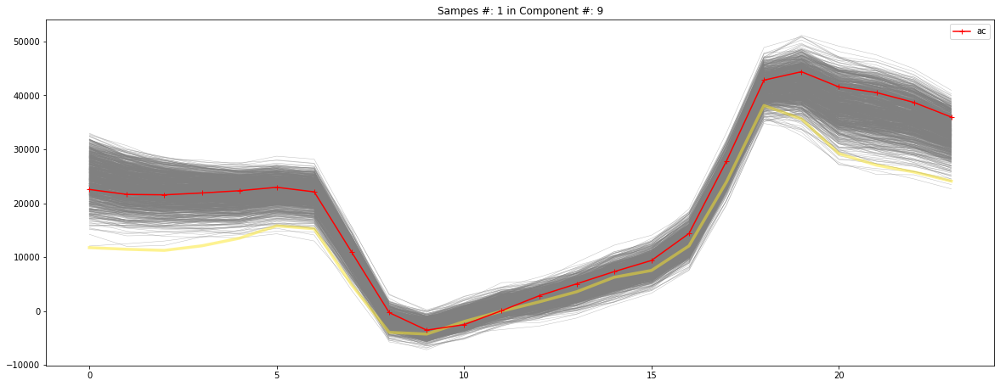

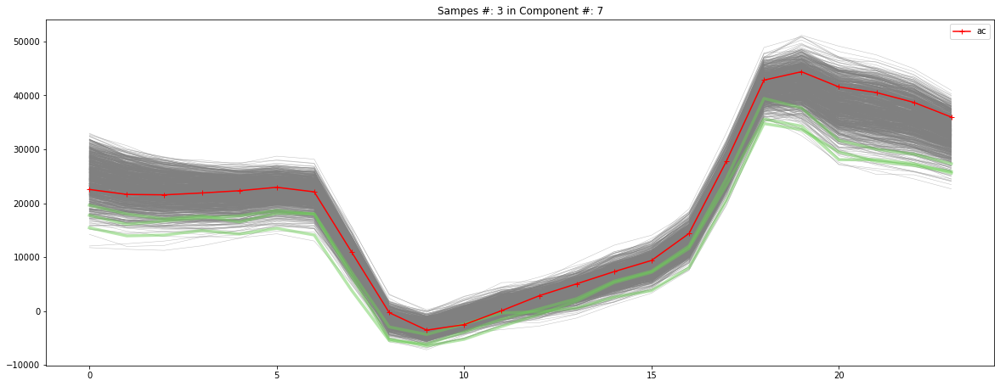

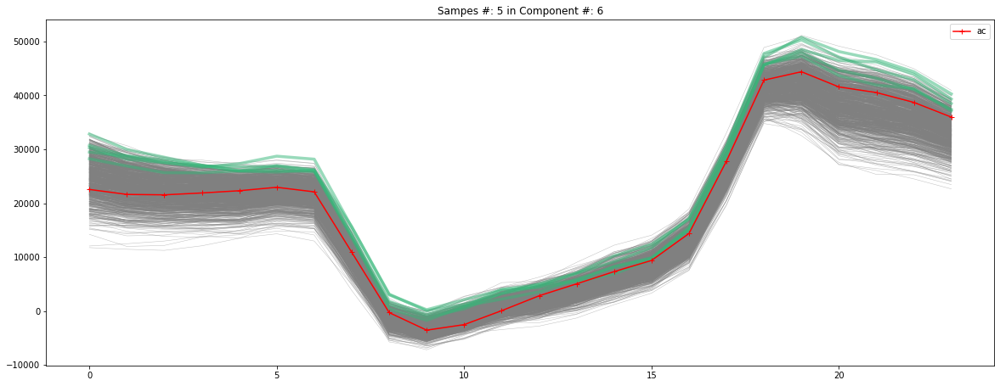

...

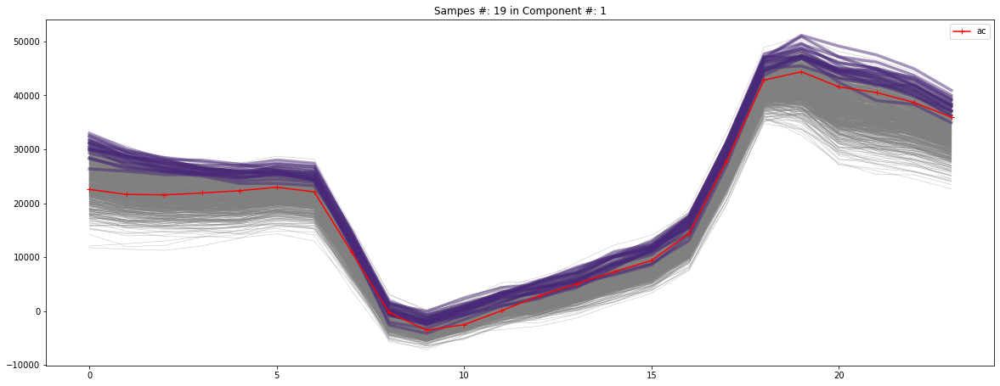

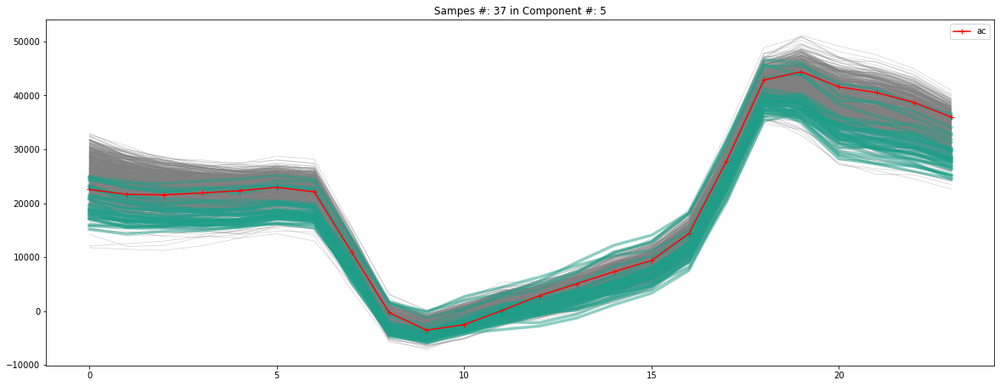

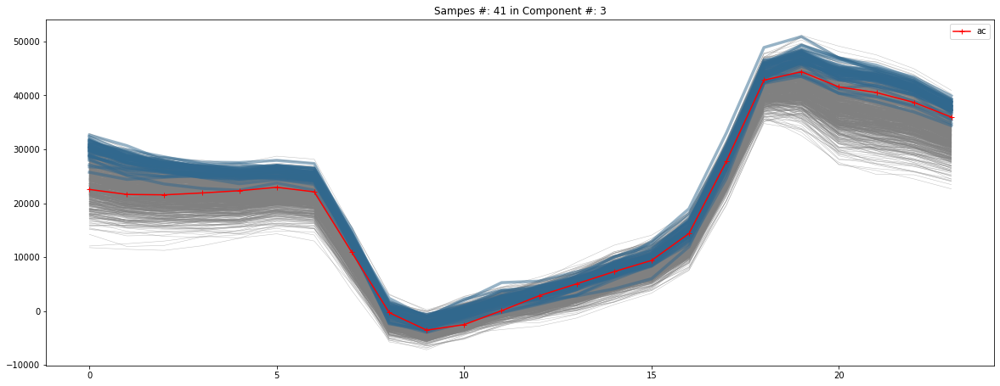

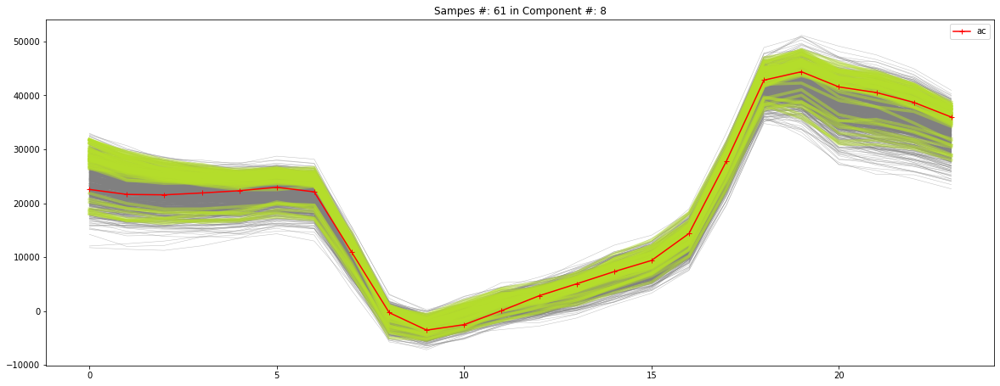

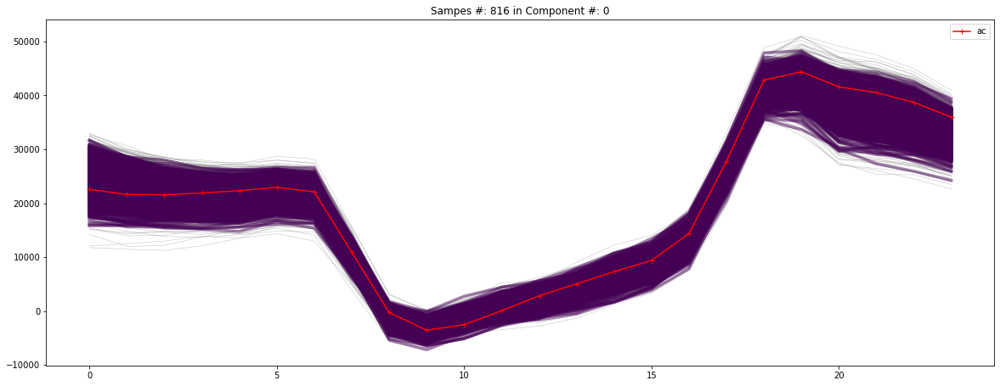

In [73]:
# This is the path to data (stract inside Sim* files)
path_to_data = r'/Users/Guille/Desktop/STATS/data/'

# Loop over day-files in data directory
for file in glob.glob(path_to_data + r'Sim*'):
    print(file)
    
    L_, S_, W_ = _load_all_datasets(file)

    # Aggregate actual from load, solar and wind
    L_ac_total_ = np.sum(L_[0], axis = 1)
    S_ac_total_ = np.sum(S_[0], axis = 1)
    W_ac_total_ = np.sum(W_[0], axis = 1)
    #print(L_ac_total_.shape, S_ac_total_.shape, W_ac_total_.shape)

    # Aggregate forecast from load, solar and wind
    L_fc_total_ = np.sum(L_[1], axis = 1)
    S_fc_total_ = np.sum(S_[1], axis = 1)
    W_fc_total_ = np.sum(W_[1], axis = 1)
    #print(L_fc_total_.shape, S_fc_total_.shape, W_fc_total_.shape)
    
    # Aggregate sceneratios from load, solar and wind
    L_sc_total_ = np.sum(L_[2], axis = 2)
    S_sc_total_ = np.sum(S_[2], axis = 2)
    W_sc_total_ = np.sum(W_[2], axis = 2)
    #print(L_sc_total_.shape, S_sc_total_.shape, W_sc_total_.shape)
    
    # Compute the Net load actual, forecast and scenarios
    N_ac_total_ = L_ac_total_ - S_ac_total_ - W_ac_total_
    N_fc_total_ = L_fc_total_ - S_fc_total_ - W_fc_total_
    N_sc_total_ = L_sc_total_ - S_sc_total_ - W_sc_total_

    x_24_ = np.arange(0, N_fc_total_.shape[0], 1)
    
    plt.figure(figsize = (20, 5.5))
    plt.subplot(131)
    plt.title('Load Demand Scenarios')
    plt.plot(x_24_, L_sc_total_, color = 'gray', alpha = 0.75, linewidth = .1)
    plt.plot(x_24_, L_ac_total_, color = 'red', marker = '+', label = 'ac')
    plt.plot(x_24_, L_fc_total_, color = 'black', marker = 'o', markerfacecolor = 'None', label = 'fc')
    plt.legend()
    plt.grid()

    plt.subplot(132)
    plt.title('Solar Generation Scenarios')
    plt.plot(x_24_, S_sc_total_, color = 'gray', alpha = 0.75, linewidth = .1)
    plt.plot(x_24_, S_ac_total_, color = 'red', marker = '+', label = 'ac')
    plt.plot(x_24_, S_fc_total_, color = 'black', marker = 'o', markerfacecolor = 'None', label = 'fc')
    plt.legend()
    plt.grid()

    plt.subplot(133)
    plt.title('Wind Generation Scenarios')
    plt.plot(x_24_, W_sc_total_, color = 'gray', alpha = 0.75, linewidth = .1)
    plt.plot(x_24_, W_ac_total_, color = 'red', marker = '+', label = 'ac')
    plt.plot(x_24_, W_fc_total_, color = 'black', marker = 'o', markerfacecolor = 'None', label = 'fc')
    plt.legend()
    plt.grid()

    # Compute Distribution
    #g_N_sc_total_ = _joint_gamma_dist(N_sc_total_)
    n_N_sc_total_ = _multivariate_norma_dist(N_sc_total_)
    _plot(N_sc_total_, N_ac_total_, N_fc_total_, n_N_sc_total_)

    # Data Standardization
    X_ = np.array(N_sc_total_.T, dtype = float)
    X_ = StandardScaler().fit(X_).transform(X_)

    # Kernel Functions
    #K_ = linear_kernel(X_, X_)
    #K_ = polynomial_kernel(X_, X_, degree = 2, gamma = 10.)
    #K_ = rbf_kernel(X_, X_, gamma = 10.)
    #K_ = laplacian_kernel(X_, X_, gamma = 10.)
    K_ = sigmoid_kernel(X_, X_, gamma = .15, coef0 = 10.)

    # PCA in a feature space  
    _KPCA = KernelPCA(n_components          = 2,
                      eigen_solver          = 'dense',
                      kernel                = 'precomputed', 
                      fit_inverse_transform = False).fit(K_)

    # Reduce dimensionality of the feature space
    X_prime_ = _KPCA.transform(K_)

    # Dirichlet Process in the dimensionality reduced feature space 
    _DPMM = BayesianGaussianMixture(n_components                    = 25,
                                    covariance_type                 = 'full',
                                    weight_concentration_prior      = 1e-10,
                                    weight_concentration_prior_type = "dirichlet_process",
                                    n_init                          = 5,
                                    random_state                    = 2).fit(X_prime_)

    # Predict Cluster of each sample in the dimensionality reduced feature space 
    z_hat_ = _DPMM.predict(X_prime_)

    # Find cluster with samples and their number of sample
    i_components_, n_samples_ = np.unique(z_hat_, return_counts = True)
    print(i_components_, n_samples_)

    plt.figure(figsize = (20, 5))
    plt.scatter(X_prime_[:, 0], X_prime_[:, 1], c      = z_hat_, 
                                                marker = '.',
                                                s      = 350.)
    plt.colorbar()
    plt.grid()
    plt.show()

    colors_ = plt.cm.viridis(np.linspace(0, 1., i_components_[-1] + 1))
    
    # Loop over components from the one with less samples to the one with more samples
    for i in i_components_[np.argsort(n_samples_)]:
        idx_ = z_hat_ == i

        plt.figure(figsize = (20, 7.5))
        plt.title('Sampes #: {} in Component #: {}'.format(idx_.sum(), i))
        plt.plot(N_sc_total_[:, ~idx_], color = 'gray', alpha = .5, linewidth = .5)
        plt.plot(N_sc_total_[:, idx_], color = colors_[i], alpha = .5, linewidth = 3.5)
        plt.plot(x_24_, N_ac_total_, color = 'red', marker = '+', label = 'ac')
        plt.legend()
        plt.show()